# Explainer Notebook - Movie analysis
Oscar Fehrn, Emil Godsk & Frederik Flint

## Motivation
### Dataset
We are going to analyze movies, and to that extend we need a big movie dataset. 

We used the titles provided in the dataset downloaded from [here](https://grouplens.org/datasets/movielens/latest/). 
The dataset downloaded had titles to approximately 58k movies, and corresponding ids to TMDB (The Movie DataBase) and OMDB (Open Movie DataBase). We used this dataset, to query TMDB and OMDB, extracting all the data we could get in our hands. Some of the titles weren't available from the two API's, and after removing all movies released before 1980, we were left with approximately 40k movie titles, each wih extensive data.

The 40k movie titles makes a base for our data and analysis. We will however apply filters to the data in each step of our paper, to make sure that the results are digestible, and maybe more importantly computable. We did encounter very long operation times when creating network of actors when there were more than 200k actors, and even if we were able to compute that, the network generated would probably be too swarmed to understand anyway.

### Why this dataset?
We used this dataset, in opposition to a standard datadump from imdb, in order to analyze way more movies than a couple of thousands. We wanted to create a very generic analysis, and in order to achieve this, we felt that a couple of thousand movies, weren't sufficient. With our dataset, we are equipped with 40 thousand, well structured and datafilled, movie-titles, which we made easily accessible to make our analysis easy. 

### Goal
We want to depict the landscape of movies for the user. We want to discover communities between actors, characteristics of actors and genres. We want to know how different actors and genres compares to each other, and we want to make all our findings easily understandable and entertaining to read. Hopefully we will provide you with a lot of meaningful analysis', that widens your knowledge of movies.

## Dataset properties
### Cleaning and filtering of data
We started with approximately 58k movie-titles, but without any matching data. We then queried TMDB and OMDB in order to create our own dataset. During this download script, we lost a couple of hundred titles, due to wrong ids' or connection issues. 

With our newly downloaded data, we wanted to format it, and extract exactly what we needed in order to do our analysis. First we actually went ahead and removed all movies released before 1980. This left us with four decades of movie-titles, with a total amount of approximately 40k titles. We also removed movies that aren't released yet, since we didn't want to work with half-finished plot-descriptions and movies without ratings. After removing movies that weren't released, removed duplicates, and movies without ratings or plots, we were left with approximately 39k titles with well formed data. 

### Dataset stats
Total count of movies: **39652**

Attributes of each movie:
```
{
    "adult": false, 
    "backdrop_path": "/gE1DHa82NZVb9B2Lx2cLNz43Iwd.jpg", 
    "belongs_to_collection": null, 
    "budget": 0, 
    "genres": [], 
    "homepage": null, 
    "id": 1710, 
    "imdb_id": "tt0112722", 
    "original_language": "en", 
    "original_title": "Copycat", 
    "overview": "An agoraphobic psychologist (...).", 
    "popularity": 11.534, 
    "poster_path": "/80czeJGSoik22fhtUM9WzyjUU4r.jpg", 
    "production_companies": [], 
    "production_countries": [], 
    "release_date": "1995-10-27", 
    "revenue": 0, 
    "runtime": 124, 
    "spoken_languages": [], 
    "status": "Released", 
    "tagline": "One man is copying (...).", 
    "title": "Copycat", 
    "video": false, 
    "vote_average": 6.5, 
    "vote_count": 438, 
    "credits": {}, 
    "keywords": {}, 
    "omdb": {
        "ratings": [], 
        "plot": "In San Francisco, (...))"
    }
}
```

Attributes regarding our network varied depending on some of the choices that we made, so these will be described in the network analysis part.

## Preparing the notebook

### Imports

In [1]:
# Modules
from nltk.corpus import stopwords
from nltk import *
import nltk
import community
import wordcloud

# OS file system
from os import listdir, path
from os.path import isfile, join
import os

# Python libraries
import re
import string
import json
import operator
import math
import random
import csv

# Data analysis libraries 
import numpy as np
import pandas as pd
import networkx as nx

# Visualization libraries
%matplotlib inline
from fa2 import ForceAtlas2
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

### Classes and Initializers

In [2]:
class Actor:
    
    def __init__(self, id, name, gender):
        self.id = id
        self.name = name
        self.gender = gender
        self.movies = []
        self.coActors = collections.defaultdict(int)
    
    def __str__(self):
        return "--------- Actor ---------\nID: {}\nName: {}\nGender: {}\nAmount of Movies: {}\nAmount of Co-Actors: {}\n-------------------------".format(self.id, self.name, self.gender, len(self.movies), len(self.coActors))
    
    def addMovie(self, movie):
        self.movies.append(movie)
    
    def addCoActor(self, actor):
        self.coActors[actor] += 1
        
    def getMostPlayedGenre(self):
        genresDictionary = collections.defaultdict(int)
        for movie in self.movies:
            for genre in movie.genres:
                genresDictionary[genre] += 1
        try:
            favoriteGenre = max(genresDictionary.items(), key=operator.itemgetter(1))[0]
        except:
            return None
        
        return favoriteGenre

In [3]:
class Movie:
    
    def __init__(self, id, title, releaseDate, budget, revenue, ratings, actors, crew, plot, genres, imdbId, imdbRating, productionCompanies):
        self.id = id
        self.title = title
        self.releaseDate = releaseDate
        self.releaseYear = int(releaseDate.split("-")[0])
        self.releaseMonth = int(releaseDate.split("-")[1])
        self.releaseDay = int(releaseDate.split("-")[2])
        self.budget = budget
        self.revenue = revenue
        self.ratings = ratings
        self.actors = actors
        self.crew = crew
        self.plot = plot
        self.genres = genres
        self.imbdId = imdbId
        self.imdbRating = imdbRating
        self.productionCompanies = productionCompanies
        
    def __str__(self):
        return "--------- Movie ---------\nID: {}\nTitle: {}\nRelease Date: {}\nBudget: {}\nRevenue: {}\nRatings: {}\nAmount of Actors: {}\nAmount of Crew: {}\nPlot: {}\nGenres: {}\n-------------------------".format(self.id, self.title, self.releaseDate, self.budget, self.revenue, self.ratings, len(self.actors), len(self.crew), self.plot, self.genres)
    

### Import data and create objects

In [4]:
actorsDictionary = {}
moviesDictionary = {}

with open("./moviedata/moviedata_full", encoding='utf-8') as f:
    allMovies = f.read().split('\n')
    
    for movieData in allMovies:
        
        try:
            movieDataAsJson = json.loads(movieData)
        except:
            continue
            
        movieActors = []
        for actor in movieDataAsJson["credits"]["cast"]:
            if actor["id"] in actorsDictionary:
                movieActors.append(actorsDictionary[actor["id"]])
                continue
                
            movieActor = Actor(actor["id"], actor["name"], actor["gender"])
            movieActors.append(movieActor)
            
            actorsDictionary[movieActor.id] = movieActor
        
        
        id = movieDataAsJson["id"]
        title = movieDataAsJson["title"]
        releaseDate = movieDataAsJson["release_date"]
        budget = movieDataAsJson["budget"]
        revenue = movieDataAsJson["revenue"]
        ratings = movieDataAsJson["omdb"]["ratings"]
        crew = movieDataAsJson["credits"]["crew"]
        plot = movieDataAsJson["omdb"]["plot"]
        movieGenres = [genre["name"] for genre in movieDataAsJson["genres"]]
        imdbId = movieDataAsJson["imdb_id"]
        productionCompanies = [value['name'] for value in movieDataAsJson['production_countries']]
            
        for ratingGroup in movieDataAsJson["omdb"]["ratings"]:
            if ratingGroup['Source'] == 'Internet Movie Database': 
                imdbRating = float(ratingGroup['Value'].split('/')[0])                
        
        movie = Movie(id, title, releaseDate, budget, revenue, ratings, movieActors, crew, plot, movieGenres, imdbId, imdbRating, productionCompanies)
        moviesDictionary[movie.id] = movie
        
        for movieActor in movieActors:
            actorsDictionary[movieActor.id].addMovie(movie)
            for coMovieActor in movieActors:
                if (movieActor.id == coMovieActor.id):
                    continue
                
                actorsDictionary[movieActor.id].addCoActor(coMovieActor)
    f.close()

### Describe this

In [5]:
tokenizeLemmatizer = nltk.stem.WordNetLemmatizer()
tokenizeStopwords = nltk.corpus.stopwords.words('english')

tokenizeAllowedWords = {}
for tokenWord in nltk.corpus.words.words():
    tokenizeAllowedWords[tokenWord] = True
for tokenWord in list(nltk.corpus.wordnet.all_lemma_names()):
    tokenizeAllowedWords[tokenWord] = True

def tokenize(string, excludeWords):
    # remove special characters (punctuation, numbers, numbers)
    string = re.sub(r'[^a-zA-Z\s]', '', string)
    
    words = []
    tokens = nltk.word_tokenize(string)
            
    for token in tokens:
        lower_cased_token = token.lower()
        
        # lemmatize to reduce words to their root
        lower_cased_token = tokenizeLemmatizer.lemmatize(lower_cased_token)

        # remove words with less than 3 characters
        if len(lower_cased_token) < 3:
            continue
        
        # remove stopwords
        if lower_cased_token in tokenizeStopwords:
            continue

        # only allowed english words
        if not lower_cased_token in tokenizeAllowedWords:
            continue
        
        # remove user defined words
        if lower_cased_token in excludeWords:
            continue
        
        words.append(lower_cased_token)

    return words

## A network of actors

### Initialize functions

Below function removes the top x amount of nodes, based on their degree, and removes the other.

In [6]:
def removeAnythinButTopNodes(network, ammount):
    sortedDegreeDictionary = sorted(dict(network.degree).items(), key = lambda kv:(kv[1], kv[0]), reverse=True)

    counter = 0
    for key, value in sortedDegreeDictionary:
        counter += 1
        if (counter < ammount + 1):
            continue 
        
        network.remove_node(key)

Below function removes all actors that has no genre attached to them, since we didn't want to include them in our analysis, which mainly revolves around genres.

In [7]:
def removeActorsWithNoGenres(network, actorDictionary):
    actorsList = list(network.nodes)
    for actorNode in actorsList:
        try:
            if (actorDictionary[actorNode].getMostPlayedGenre() is None):
                network.remove_node(actorNode)
        except:
            print(actorNode)

Generates a graph based on a node count. Uses previously defined functions in order to remove nodes that aren't needed.

In [8]:
def generateGraph(nodeCount):
    actorsGraph = nx.Graph()

    for key, value in actorsDictionary.items():
        actorsGraph.add_node(value.id, gender=value.gender, name=value.name)
        
    for key, value in actorsDictionary.items():
        strongCoActors = []
        for coKey, coValue in value.coActors.items():
            if (coValue > 2):
                strongCoActors.append((value.id, coKey.id, coValue))
                
        actorsGraph.add_weighted_edges_from(strongCoActors)
        
    removeActorsWithNoGenres(actorsGraph, actorsDictionary)
    
    
    removeAnythinButTopNodes(actorsGraph, nodeCount)
    
    return actorsGraph

### Generate graph


We did a lot of testing, but finally ending with the node-count 3000. This was simply since we wanted to have as many nodes present in the graph as possible, without slowing our calculations too much. 3000 seemed to be the golden mean

In [9]:
nodeCount = 3000

In [10]:
graph = generateGraph(nodeCount)

### Prepare colors

We simplify drawing and generating graphs with genres as color schemes, by creating this genres-dictionary. 

The idea is that the first element of the tupple is the color defining that genre. The second element of the tupple
is an array where we store all the nodes corresponding to that genre. 
The third element of the tupple is also an array, but in here we are going to store the nodes corresponding to that genre, based on community detection.

In [11]:
allMostPlayedGenres = []

for actorNode in graph.nodes:
    allMostPlayedGenres.append(actorsDictionary[actorNode].getMostPlayedGenre())

genres = {
        "Crime": ("red", [], []),
        "Family": ("blue", [], []),
        "Comedy": ("yellow", [], []),
        "Documentary": ("grey", [], []),
        "Romance": ("pink",[], []),
        "Adventure": ("teal",[], []),
        "Science Fiction": ("#ccffff",[], []), #Light blue
        "Horror": ("#800000",[], []), #Dark red
        "Action": ("#cc9900",[], []), #Brown yellow ish
        "Animation": ("#009999",[], []), #Turquoise like"
        "Drama": ("#9933ff",[], []), #Purple
        "Thriller": ("#996600",[], []), #Brown
        "Mystery": ("#dbeb34",[], []), #Lime
        "TV Movie": ("#686e2d",[], []), #Dark Lime
        "Fantasy": ("#b844b4",[], []), #Sick purple
        "Music": ("#450543",[], []), #Dark dark purple
        "History": ("#70675e",[], []), #Khaki
        "Western": ("#36454f",[], []), #Charcoal
        "War": ("#ff7f50",[], []), #Coral
    }

### Append nodes to genres


Here we add all the nodes to the correct genre following the logic as explained above.

In [12]:
for node in graph.nodes:
    genre = actorsDictionary[node].getMostPlayedGenre()
    
    genres[genre][1].append(node)

### Prepare Force Atlas and generate positions


In [13]:
forceatlas2 = ForceAtlas2(
                    # Behavior alternatives
                    outboundAttractionDistribution=True,  # Dissuade hubs
                    linLogMode=False,  # NOT IMPLEMENTED
                    adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                    edgeWeightInfluence=1,

                    # Performance
                    jitterTolerance=0.01,  # Tolerance
                    barnesHutOptimize=True,
                    barnesHutTheta=1.2,
                    multiThreaded=False,  # NOT IMPLEMENTED

                    # Tuning
                    scalingRatio=30.0,
                    strongGravityMode=False,
                    gravity=0,

                    # Log
                    verbose=True)

In [14]:
positions = forceatlas2.forceatlas2_networkx_layout(graph, pos=None, iterations=1000)

100%|██████████| 1000/1000 [00:33<00:00, 29.55it/s]

BarnesHut Approximation  took  21.44  seconds
Repulsion forces  took  11.13  seconds
Gravitational forces  took  0.12  seconds
Attraction forces  took  0.17  seconds
AdjustSpeedAndApplyForces step  took  0.43  seconds


### Draw graph

Since we want to draw nodes seperately for each genre, in order to neatly include a legend displaying genre-colors, we create this dictionary, keeping track of all the sizes of the nodes.

In [15]:
nodeSizesDict = {}

degrees = dict(graph.degree)

for key, value in degrees.items():
    nodeSizesDict[key] = value * (7500/nodeCount)

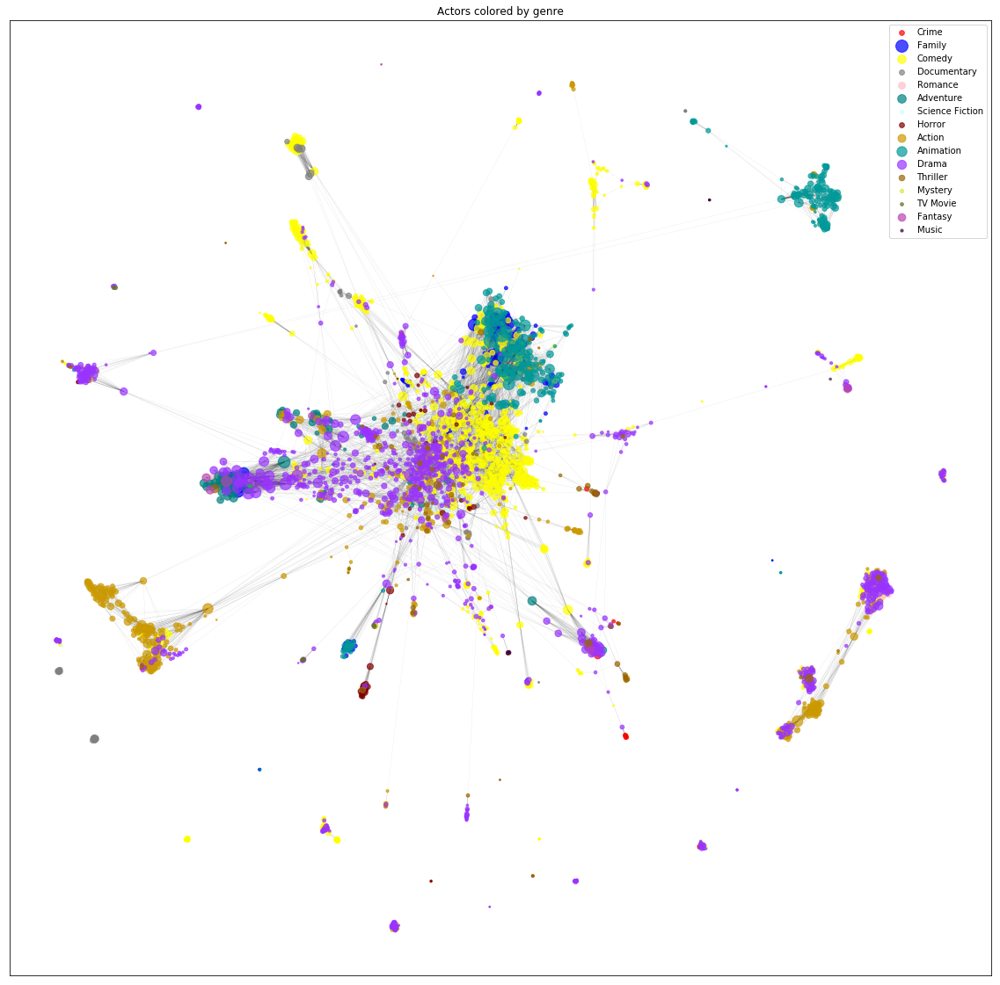

In [16]:
plt.figure(figsize=(20, 20))
plt.title("Actors colored by genre")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[1]
    
    nodeSizes = [nodeSizesDict[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=nodeSizes, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)
plt.show()


As it is also described in our paper, it seems that there are some clusters occuring here, that heavily correlates with the genres that the actors appear in. We are going to investigate that in more detail later.

### Degree distribution

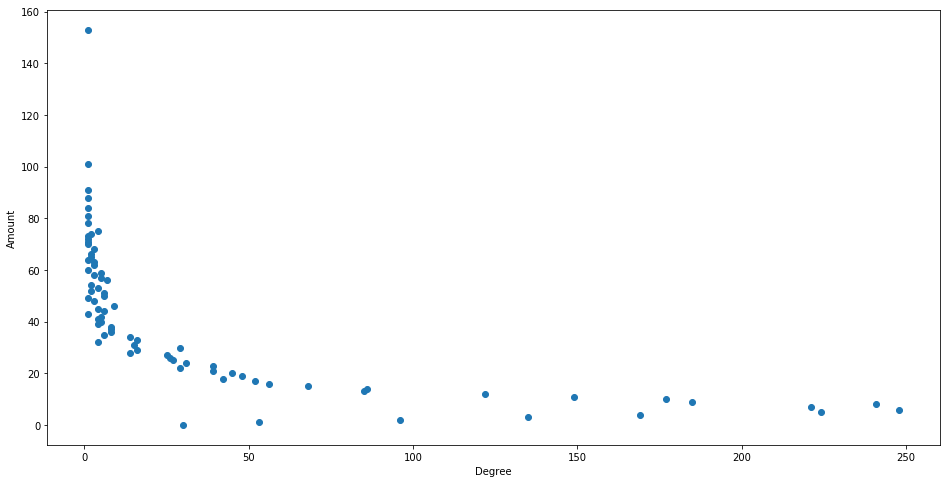

In [17]:
degree_sequence = [d for n, d in graph.degree()]  # degree sequence
# print "Degree sequence", degree_sequence
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

plt.figure(figsize=(16, 8))
plt.plot(cnt, deg, 'o')
plt.xlabel('Degree')
plt.ylabel('Amount')
plt.show()

The degree distribution is displayed above, and look what you could expect from a real life social network. 

In [18]:
print("Average degree of graph:", sum(degree_sequence) / len(degree_sequence))
print("Amount of nodes in graph", len(graph.nodes))
print("Amount of edges in graph", len(graph.edges))

Average degree of graph: 12.514666666666667
Amount of nodes in graph 3000
Amount of edges in graph 18772


### Degree distribution - Logarithmic


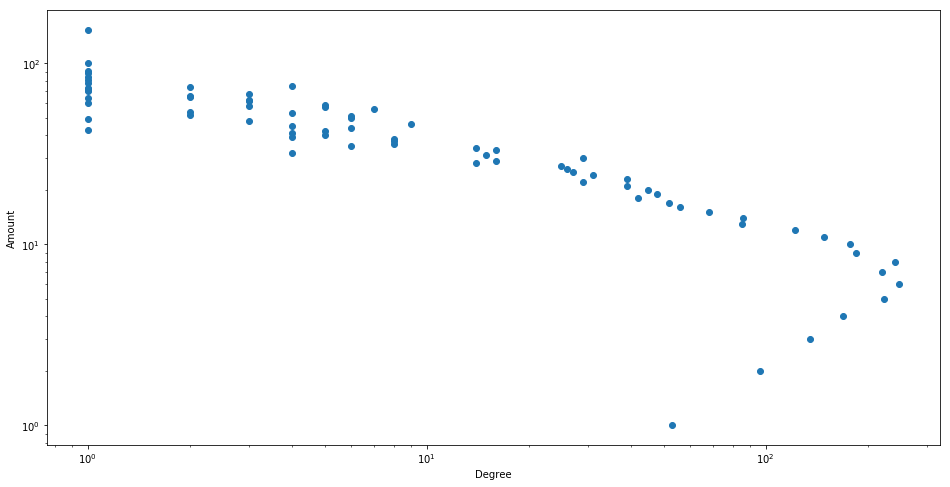

In [19]:
plt.figure(figsize=(16, 8))
plt.plot(cnt, deg, 'o')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Degree')
plt.ylabel('Amount')
plt.show()

### Highest degree nodes

In [20]:
degreeSequenceWithKeys = sorted([(d, n) for n, d in graph.degree()], reverse=True)  # degree sequence
    
for i in range(0,5):
    print(actorsDictionary[degreeSequenceWithKeys[i][1]])
    print("Degree:", degreeSequenceWithKeys[i][0])
    print("-------------------------")
    print()

--------- Actor ---------
ID: 15831
Name: Frank Welker
Gender: 2
Amount of Movies: 188
Amount of Co-Actors: 2663
-------------------------
Degree: 153
-------------------------

--------- Actor ---------
ID: 84495
Name: Jess Harnell
Gender: 2
Amount of Movies: 47
Amount of Co-Actors: 1146
-------------------------
Degree: 101
-------------------------

--------- Actor ---------
ID: 15762
Name: Tara Strong
Gender: 1
Amount of Movies: 74
Amount of Co-Actors: 1095
-------------------------
Degree: 91
-------------------------

--------- Actor ---------
ID: 78317
Name: Bob Bergen
Gender: 2
Amount of Movies: 48
Amount of Co-Actors: 1134
-------------------------
Degree: 88
-------------------------

--------- Actor ---------
ID: 2231
Name: Samuel L. Jackson
Gender: 2
Amount of Movies: 127
Amount of Co-Actors: 3480
-------------------------
Degree: 84
-------------------------



We find it interesting that Jess Harnell who only starred with 1146 actors have a higher node degree than Samuel L. Jackson who starred with 3480 different actors. We want to discover the distribution of co-starrings for these two actors. 

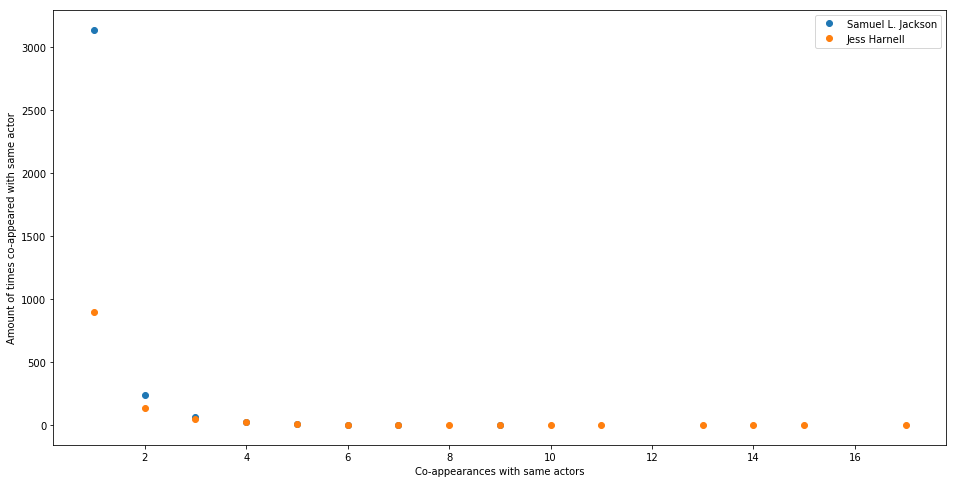

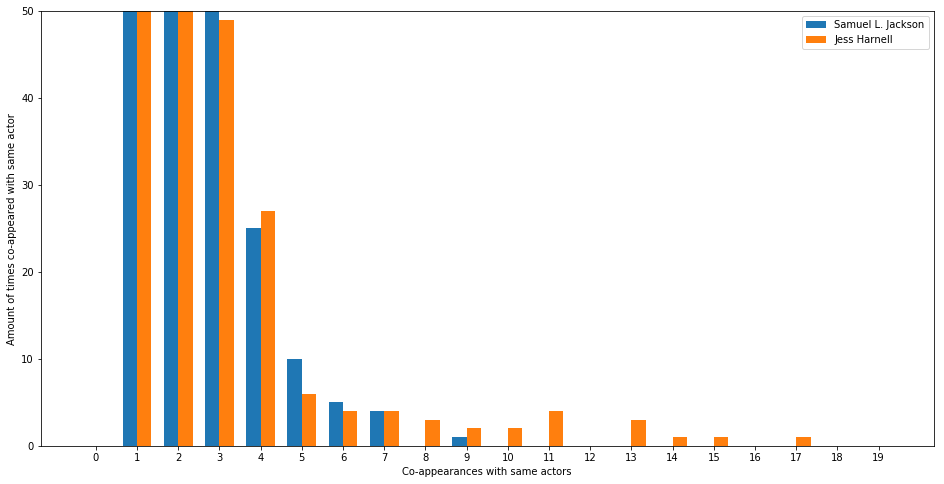

In [21]:
samLJacksonCoActors = []

for key, value in dict(actorsDictionary[2231].coActors).items():
    samLJacksonCoActors.append(value)

# print "Degree sequence", degree_sequence
samLJacksonDegreeCount = collections.Counter(samLJacksonCoActors)
degSam, cntSam = zip(*samLJacksonDegreeCount.items())

###############################################################

jessHarnell = []

for key, value in dict(actorsDictionary[84495].coActors).items():
    jessHarnell.append(value)

# print "Degree sequence", degree_sequence
jessHarnellDegreeCount = collections.Counter(jessHarnell)
degJess, cntJess = zip(*jessHarnellDegreeCount.items())

###############################################################

plt.figure(figsize=(16, 8))

scalarJess = list(range(0,20))
scalarSam = list(range(0,20))

for i in range(0,20):
    scalarJess[i] = 0
    scalarSam[i] = 0

N = len(scalarJess)
ind = np.arange(N)

for key, value in jessHarnellDegreeCount.items():
    scalarJess[key] = value

for key, value in samLJacksonDegreeCount.items():
    scalarSam[key] = value


plt.plot(degSam, cntSam, 'o', label="Samuel L. Jackson")
plt.plot(degJess, cntJess, 'o', label="Jess Harnell")
plt.legend()

plt.xlabel('Co-appearances with same actors')
plt.ylabel('Amount of times co-appeared with same actor')
plt.show()

width = 0.35 

plt.figure(figsize=(16,8))
plt.bar(ind - 1/2*width, scalarSam, width, label="Samuel L. Jackson")
plt.bar(ind + 1/2*width, scalarJess, width, label="Jess Harnell")
plt.xticks(ind)
plt.ylim((0, 50))
plt.legend()
plt.xlabel('Co-appearances with same actors')
plt.ylabel('Amount of times co-appeared with same actor')
plt.show()

Based on the two plots it can be seen that even though Samuel L. Jackson appears in the same movie with way more actors, he often only appears one time with each actor however, and since our network takes multiple co-appearances into account, this doesn't help his node degree. 

Jess Harnell has way more actors that he appears in multiple movies with than Sam. Jackson, and therefore his node-degree is also higher. 

These are the top actors of the graph. As it can be seen, it doesn't necessarily have to be the actors with the highest total co-actors that has the highest degree, since it matters more to have more different actors that you've starred with.

### Friendship paradox

In [22]:
friendshipTrue = []
friendshipFalse = []

for node in graph.nodes:
    edges = graph.edges(node)
    edgesCount = len(edges)
    
    if edgesCount == 0:
        continue
    
    neighbourOutEdgesSum = 0
    for edgeFrom, edgeTo in edges:
        neighbourOutEdgesSum += len(graph.edges(edgeTo))
    
    averageNeighbourEdges = neighbourOutEdgesSum / edgesCount
    
    if (edgesCount < averageNeighbourEdges):
        friendshipTrue.append(node)
    else:
        friendshipFalse.append(node)
        
print("Friendship paradox true", len(friendshipTrue))
print("Friendship paradox false", len(friendshipFalse))

print("Friendship paradox true %", len(friendshipTrue) / (len(friendshipTrue) + len(friendshipFalse)))
print("Friendship paradox false %", len(friendshipFalse) / (len(friendshipTrue) + len(friendshipFalse)))

Friendship paradox true 2281
Friendship paradox false 689
Friendship paradox true % 0.768013468013468
Friendship paradox false % 0.231986531986532


We can see that the friendship paradox in general holds for this network, which was also what we expected.

### Giant connected component

We want to see how much of the graph is actually connected to each other, and how many hubs are alone. To do that, we find the giant connected component of the graph, and compare it to the original graph.

In [23]:
gcc = max(nx.connected_component_subgraphs(graph), key=len)

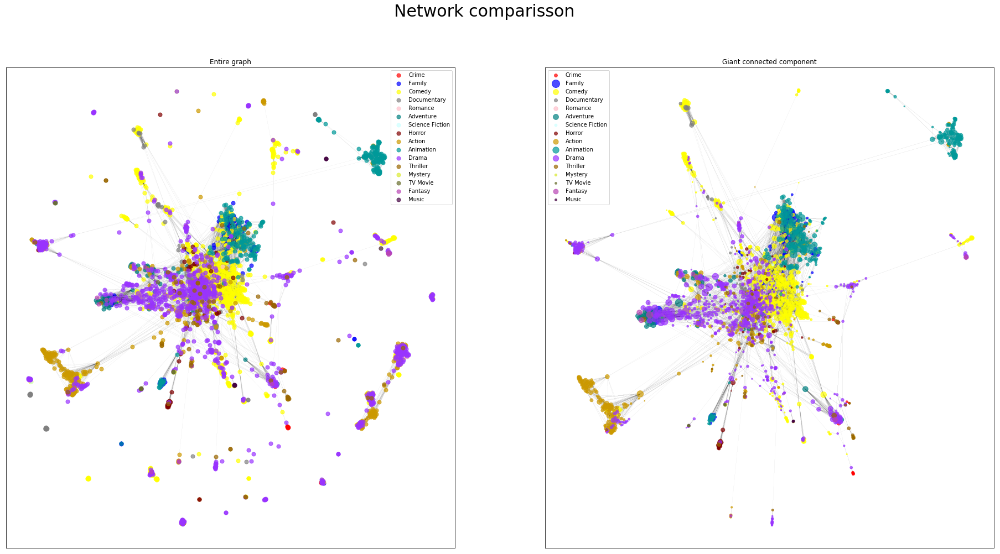

In [24]:
plt.subplots(1,2, figsize=(32,16))
plt.suptitle('Network comparisson', fontsize=30)

plt.subplot(1, 2, 1)
plt.title("Entire graph")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[1]
    
    degrees = dict(graph.degree)
    nodeSizes = [nodeSizesDict[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=50, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)


plt.subplot(1, 2, 2)
plt.title("Giant connected component")

for key, value in genres.items():
    if (not value[1]):
        continue

    genreName = key
    nodeColor = value[0]
    nodeList = [value for value in value[1] if value in gcc.nodes]

    nodeSizes = [nodeSizesDict[v] for v in nodeList]

    nx.draw_networkx_nodes(gcc, positions, node_size=nodeSizes, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(gcc, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)
plt.show()

print("Amount of nodes in the Giant Connected Component", len(gcc))

It seems that there are 3000 - 2390 = 610 nodes that are not connected to the rest of the graph. We will investigate why these nodes might not be together with the rest.

Here we were interested too see if any hubs arrive out of the gcc, but since we are interested in collection of nodes, and not only single nodes, we set a threshold to 20, and only wanted to see the groups that are larger than that threshold.

For each subgraph, we want to see what the main genre, and the most common production country is for the movies, since we suspect that these hubs might be non-american actors who primarily play movies in their own language.

In [25]:
countriesDict = {
        "United States of America": ("red", [], []),
        "Italy": ("blue", [], []),
        "Russia": ("yellow", [], []),
        "India": ("grey", [], []),
        "Serbia": ("pink",[], []),
        "Finland": ("teal",[], []),
        "South Korea": ("#ccffff",[], []) #Light blue
    }

In [26]:
connectedComponents = nx.connected_component_subgraphs(graph)
for connectedComponent in connectedComponents:
    if len(connectedComponent.nodes) > 20:
        countries = defaultdict(int)
        
        for node in connectedComponent.nodes:
            nodeCountries = [movie.productionCompanies for movie in actorsDictionary[node].movies]
            
            for nodeCountry in nodeCountries:
                for nestedNodeCountry in nodeCountry:
                    countries[nestedNodeCountry] += 1       
        
        maxItem = max(countries.items(), key=operator.itemgetter(1))
        print(maxItem[0], maxItem[1])
        print()
        print()
        
        countriesDict[maxItem[0]][1].extend(connectedComponent.nodes)

United States of America 42081


Italy 814


Russia 610


India 4509


Serbia 183


Finland 356


South Korea 617




As it can be seen, the first collection was the gcc, which obviously is dominated by the USA. Interestingly enough, are all the other collections dominated by another country, which is probably the reason that they arent connected to any other part of the graph. 

Based on this founding, we want to draw the graph again, this time colored by countries.

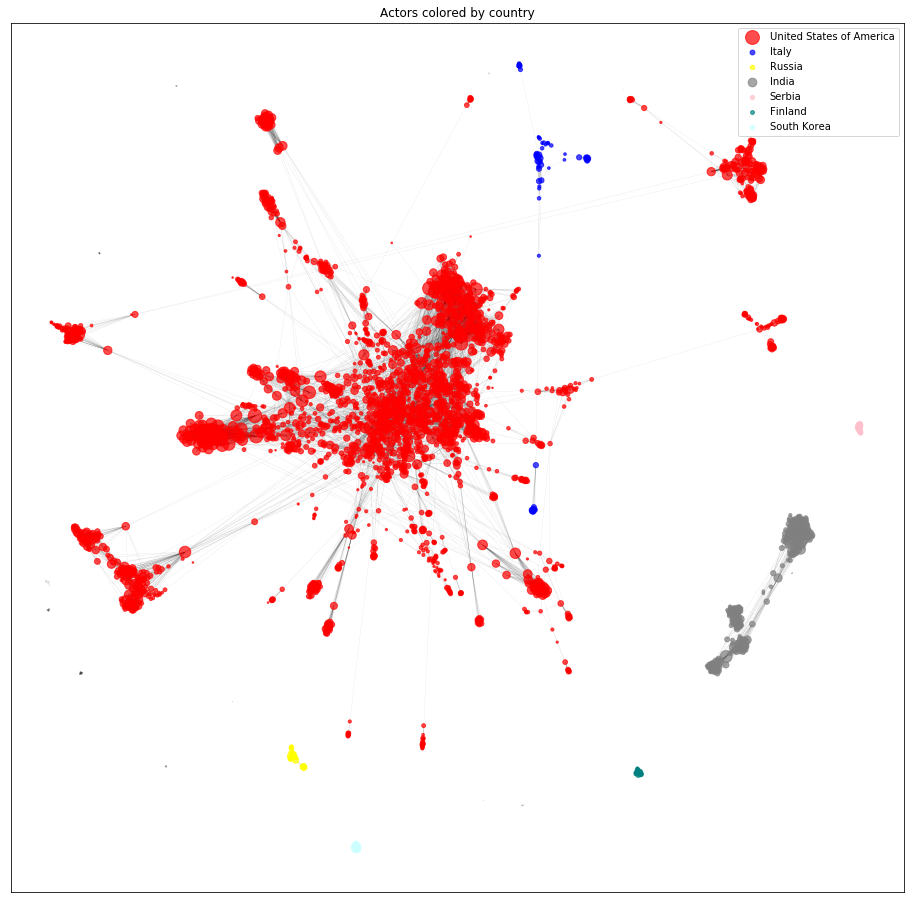

In [27]:
plt.figure(figsize=(16, 16))
plt.title("Actors colored by country")

for key, value in countriesDict.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[1]
    
    nodeSizes = [nodeSizesDict[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=nodeSizes, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)
plt.show()

The graphs shows very clearly how the different collections of node correspond to different countries, and especially how dominating USA is in the world of movies. However moving forward, we want to take a deeper look into the community detection based on genre, since we think it is quite more specific, and thereby more interesting.

### Community detection

In [28]:
partitions = community.best_partition(graph)

In [29]:
print("Modularity of found partitions:", community.modularity(partitions, graph))

Modularity of found partitions: 0.8449716391366


0.85 is a quite high modularity, especially when compared to the modularity generated by tweets and wikipedia pages of the congressmen. We therefore believe we have found something special, and we want to see what these partitions in reality corresponds to.

We are going to create a matrix that visualizes the partitions crossed with the genres that we've earlier introduced. 

In [30]:
genreDictionary = {}

for genre in allMostPlayedGenres:
    genreDictionary[genre] = (
        node
        for node
        in graph.nodes
        if actorsDictionary[node].getMostPlayedGenre() == genre
    )

communities = list(dict.fromkeys([value for key, value in partitions.items()]))

communityMatrix = [[0.0 for i in range(len(allMostPlayedGenres))] for i in communities]

counter = 0
for genre in allMostPlayedGenres:
    subgraph = graph.subgraph(genreDictionary[genre])

    for key, value in partitions.items():
        if (key in subgraph.nodes):
            communityMatrix[value][counter] = communityMatrix[value][counter] + 1
    counter += 1

df = pd.DataFrame(communityMatrix, columns = [genre for genre in allMostPlayedGenres])  
maxValuesObj = df.idxmax(axis=1)

### Display generated matrix

In [31]:
df

,Comedy,Comedy,Comedy,Comedy,Family,Animation,Comedy,Thriller,Comedy,Animation,...,Animation,Animation,Comedy,Drama,Family,Comedy,Comedy,Documentary,Drama,Thriller
0,72.0,0.0,0.0,0.0,35.0,117.0,0.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,249.0,0.0,0.0,0.0,2.0,14.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,53.0,0.0,0.0,0.0,0.0,3.0,0.0,11.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,23.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,54.0,0.0,0.0,0.0,2.0,4.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
89,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
90,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Looking at this matrix (mostly at the top rows) it is clear to see that the partition corresponds somewhat to the genres. 

In the following we are going to generate color based on the most common genre in each partition, and then use these colors to draw the graph. Then we will finally compare it side-by-side with our original color-scheme and see the differences.

### Append node to genre colors

In [32]:
for key, value in partitions.items():
    node = key
    partition = value
    genre = maxValuesObj[partition]
    
    genres[genre][2].append(node)

### Draw community detected graph

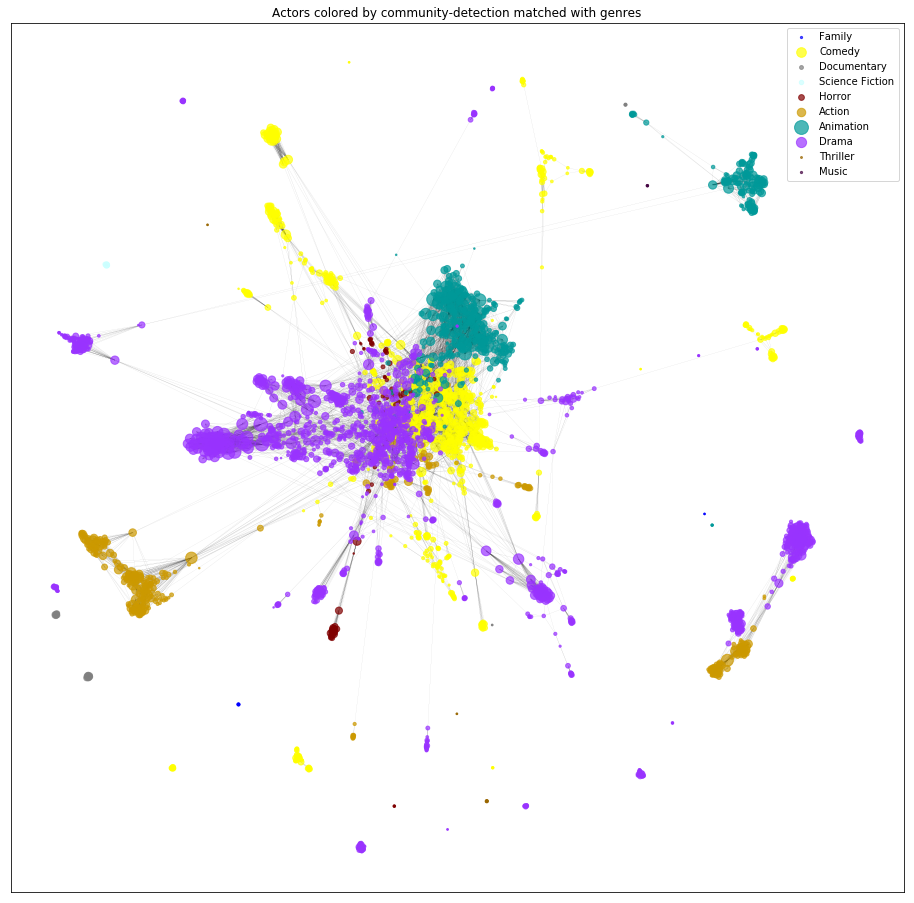

In [33]:
size = dict(graph.degree(weight='weight'))
scale = 1
sizeMap = [1+size[node]*scale for node in graph.nodes()]

plt.figure(figsize=(16, 16))
plt.title("Actors colored by community-detection matched with genres")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[2]
    
    degrees = dict(graph.degree)
    nodeSizes = [nodeSizesDict[v] for v in nodeList]
    
    nx.draw_networkx_nodes(graph, positions, node_size=nodeSizes, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')
plt.legend(scatterpoints = 1)

plt.show()

### Side-by-side comparison

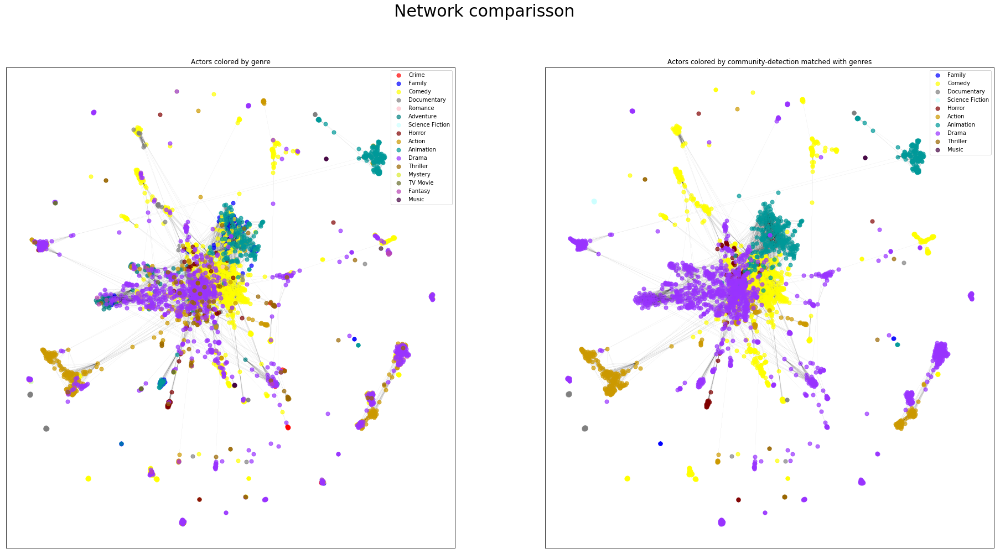

In [34]:
plt.subplots(1,2, figsize=(32,16))
plt.suptitle('Network comparisson', fontsize=30)

plt.subplot(1, 2, 1)
plt.title("Actors colored by genre")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[1]
    
    degrees = dict(graph.degree)
    nodeSizes = [nodeSizesDict[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=50, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)


plt.subplot(1, 2, 2)
plt.title("Actors colored by community-detection matched with genres")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[2]
    
    degrees = dict(graph.degree)
    nodeSizes = [nodeSizesDict[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=50, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')
plt.legend(scatterpoints = 1)
    
plt.show()

Looking at these two images, it is very clear that the partitions found from community detection, and the genres we found, corresponds with each other. The two graphs are nearly identical, even though it seems that the right graph, which shows the partition-based colors, is more smoothened in the color scheme. This happens since some of the partition were a combination of two big genres, and since we only went for the most frequent genre in each partition, some of the genres are ruled out.

### Investigating further properties

Until now, we've been looking a lot on collection of nodes, communities in the network and in general had our focus on sub-networks in the network of actors

In the following we are going to discover some of the other properties in a network like this. 

We are going to investigate the Eigenvector- and Betweenness Centrality. We will do this by drawing the graph and set the node-size to be proportional to first Eigenvector centrality, discuss the foundings, and the do the same for Betweenness centrality

### Eigenvector centrality

In [35]:
eigenVectorCentrality = dict(nx.eigenvector_centrality(graph))

In [36]:
nodeSizesDictEVC = {}

for key, value in eigenVectorCentrality.items():
    nodeSizesDictEVC[key] = value * (nodeCount)

### Drawing graph with size proportional to EVC

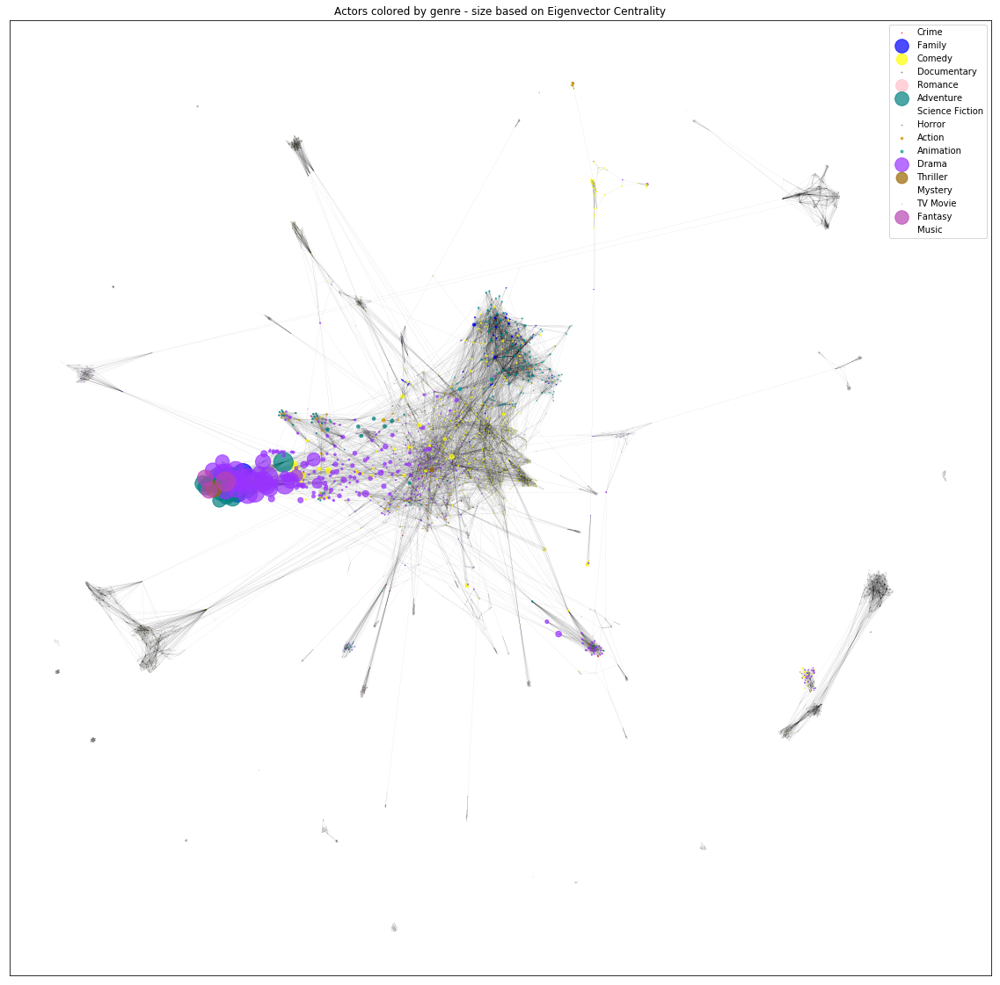

In [37]:
plt.figure(figsize=(20, 20))
plt.title("Actors colored by genre - size based on Eigenvector Centrality")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[1]
    
    nodeSizes = [nodeSizesDictEVC[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=nodeSizes, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)
plt.show()

We found it really interesting that we had his huge collection of giant nodes compared to the rest. It seemed that drama, fantasy and adventure were the main genres in this huge collection. We wanted to investigate this, so we decided to look at the top nodes based on the found eigenvector centrality, and the results were interesting.

We found out that a lot of the top actors are all actors who have starred in Harry Potter. To see how many we are actually talking about, we wrote a script that kept count of top actors in a row, who have appeared in one of the 8 Harry Potter movies

In [38]:
sortedEigenVectorCentrality = sorted(eigenVectorCentrality.items(), key=operator.itemgetter(1), reverse=True)

counter = 0

for key, value in sortedEigenVectorCentrality:
    counter += 1
    movies = actorsDictionary[key].movies
    
    starredInHp = False
    for movie in movies:
        if "Harry Potter" in movie.title:
            starredInHp = True
            break
        
    if not starredInHp:
        print("Actors in a row starring in Harry Potter:", counter)
        break

Actors in a row starring in Harry Potter: 69


It seems to be the case that the top 69 actors based on Eigenvector Centrality have all appeared in one or more Harry Potter movies. We think this can be described based on the definition of Eigenvector Centrality. Eigenvector Centrality is a measurement which depends on your neighbours. To elaborate, a node has a high Eigenvector Centrality score if its neighbours also have high scores. 

Since the Harry Potter universe have re-used their actors throughout their movies, they are a really large collection of nodes, who all keep re-appearing in the same movies

### Betweenness centrality

In [39]:
betweennessCentrality = dict(nx.betweenness_centrality(graph))

In [40]:
nodeSizesDictBC = {}

for key, value in betweennessCentrality.items():
    nodeSizesDictBC[key] = value * (nodeCount * 2)

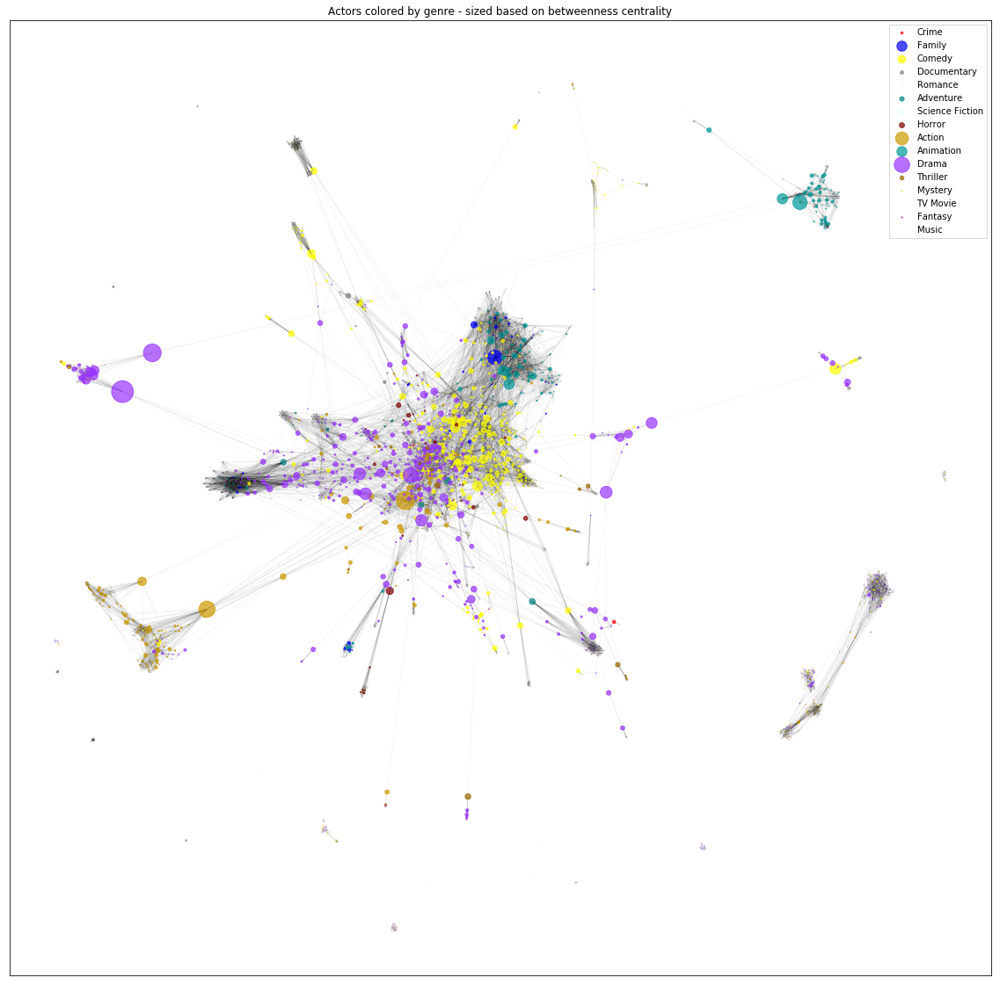

In [41]:
plt.figure(figsize=(20, 20))
plt.title("Actors colored by genre - sized based on betweenness centrality")

for key, value in genres.items():
    if (not value[1]):
        continue
    
    genreName = key
    nodeColor = value[0]
    nodeList = value[1]
    
    nodeSizes = [nodeSizesDictBC[v] for v in nodeList]
        
    nx.draw_networkx_nodes(graph, positions, node_size=nodeSizes, nodelist=nodeList, node_color=nodeColor, label=genreName, with_labels=False, alpha=0.7)

edgewidth = [d['weight'] * 0.01 for (u,v,d) in graph.edges(data=True)]
nx.draw_networkx_edges(graph, positions, arrowsize=1, width=edgewidth, edge_color='black')

plt.legend(scatterpoints = 1)
plt.show()

The take from this graph, displaying the nodes with size proportional to betweenness centrality, seems to be that all the nodes that connect one community with another are the big ones. 

This is also expected, since the betweenness centrality describes the centrality of a node in the network. More technically, it is a measurement of how often a node is used in a shortest path through the graph. 

Another interesting observation is that it seems that Drama is the genre which best connects more of the other genres. This can be an indication of drama being a quite generic genre, which is used a lot as a sub-genre when describing a movie

## Text analysis

Having now completed the network analysis we wanted to take a look at some text analysis. To do this we wanted to create wordclouds and calculate TF-IDF of the plots of the movies in order to see if we could find any interesting trends across the genres and movies.

### Wordcloud

To look at the different words used by the different movies across the different genres, we wanted to take a look at different wordclouds across the genres. To accomplish this we first define a couple of functions, that we are able to use, to make it easier for us to calculate and generate the different data needed for the wordcloud.

In [42]:
# A function to calculate the TF based on frequence of the words in all words
def calculateTF(token, tokens):
    tokensDict = collections.defaultdict(int)
    for elem in tokens:
        tokensDict[elem] += 1
        
    return tokensDict[token]

# A function to calculate the IDF based on a specific word in all words in all documents
def calculateIDF(token, tokenDocuments):
    documentsWithToken = 0
    for document in tokenDocuments:
        if (token in document):
            documentsWithToken += 1
        
    return math.log10(len(tokenDocuments)/(1+documentsWithToken))

# Calculate TF-IDF by calculating TF and IDF
def calculateTFIDF(token, tokens, tokenDocuments):
    return calculateTF(token, tokens) * calculateIDF(token, tokenDocuments)

# A function to speed up calculating all TF-IDF, as some things only need to be calculated once
def calculateAllTFIDF(tokens, tokenDocuments):
    tfidfDict = collections.defaultdict(int)
    
    tokensDict = collections.defaultdict(int)
    for elem in tokens:
        tokensDict[elem] += 1
        
    documentDict = collections.defaultdict(dict)
    for key, document in tokenDocuments.items():
        elemDict = collections.defaultdict(bool)
        for elem in document:
            elemDict[elem] = True
            
        documentDict[key] = elemDict
        
    for token in tokens:
        tf = tokensDict[token]
        
        documentCounter = 0
        for _, document in documentDict.items():
            if token in document:
                documentCounter += 1
                
        idf = math.log10(len(tokenDocuments)/(1+documentCounter))
        
        tfidfDict[token] = tf * idf

    return dict(tfidfDict)

# A function to tokenize all elements in a dictionary
def tokenizeDict(stringDict, excludeWords):
    tokensDict = collections.defaultdict(list)
    for key, elem in stringDict.items():
        tokensDict[key] = tokenize(elem, excludeWords)
        
    return dict(tokensDict)

# A function to generate a wordcloud based on the frequencies
def generateWordcloudFromFrequencies(wordsScoreDictionary):
    return wordcloud.WordCloud(background_color="white").generate_from_frequencies(wordsScoreDictionary)

# A function to generate a wordcloud based on the frequencies with a image mask
def generateMaskedWordcloudFromFrequencies(wordsScoreDictionary, imagePath):
    wordcloudMask = np.array(Image.open(path.join(imagePath)))
    return wordcloud.WordCloud(background_color="white", mask=wordcloudMask).generate_from_frequencies(wordsScoreDictionary)
    
# A function to generate a wordcloud from a space seperated string
def generateWordcloudFromString(wordsString):
    return wordcloud.WordCloud(background_color="white").generate(wordsString)

### Generate Dictionaries

We are going to generate some helper dictionaries to make it easier to work with the data

In [43]:
moviePlotsByYear = {}
moviePlotsByGenre = {}
moviePlotsByDecade = {}
moviePlotsByYearAndGenre = {}
moviePlotsByDecadeAndGenre = {}

# movie plots by release year
for _, movie in moviesDictionary.items():
    if not movie.releaseYear in moviePlotsByYear:
        moviePlotsByYear[movie.releaseYear] = ""
        
    moviePlotsByYear[movie.releaseYear] += " " + movie.plot
    
# movie plots by decade
for _, movie in moviesDictionary.items():
    movieDecade = math.floor(movie.releaseYear / 10) * 10
    if not movieDecade in moviePlotsByDecade:
        moviePlotsByDecade[movieDecade] = ""
        
    moviePlotsByDecade[movieDecade] += " " + movie.plot
    
# movie plots by genre
for _, movie in moviesDictionary.items():
    for genre in movie.genres:
        if not genre in moviePlotsByGenre:
            moviePlotsByGenre[genre] = ""
        
        moviePlotsByGenre[genre] += " " + movie.plot

# movie plots by release year and genre
for _, movie in moviesDictionary.items():
    if not movie.releaseYear in moviePlotsByYearAndGenre:
        moviePlotsByYearAndGenre[movie.releaseYear] = {}
        
    for genre in movie.genres:
        if not genre in moviePlotsByYearAndGenre[movie.releaseYear]:
            moviePlotsByYearAndGenre[movie.releaseYear][genre] = ""
            
        moviePlotsByYearAndGenre[movie.releaseYear][genre] += " " + movie.plot

# movie plots by decade and genre
for _, movie in moviesDictionary.items():
    movieDecade = math.floor(movie.releaseYear / 10) * 10
    if not movieDecade in moviePlotsByDecadeAndGenre:
        moviePlotsByDecadeAndGenre[movieDecade] = {}
        
    for genre in movie.genres:
        if not genre in moviePlotsByDecadeAndGenre[movieDecade]:
            moviePlotsByDecadeAndGenre[movieDecade][genre] = ""
            
        moviePlotsByDecadeAndGenre[movieDecade][genre] += " " + movie.plot

Having generated the different helper dictionaries, we now wanted to generate a global excludeWords list, with words we could see were pretty general across all of the genres wordclouds, and therefore gave no clear indication of the general words of the genre. This list include words such as 'one', 'two' and 'life'

In [44]:
# Create a global excludeWords list, which are general words, which we are not intereted in seeing in the wordclouds
excludeWords = ['one', 'two', 'life', 'new', 'man', 'become', 'young', 'find']

# Create a dictionary of tokens based on genres
tokensDict = tokenizeDict(moviePlotsByGenre, excludeWords)

To take a close look at the words used by the plots of the movies, we wanted to create wordclouds based on the TF-IDF analysis of the plots. TF-IDF analysis is an analysis based on the term frequencies of a document, and the inverse document frequencies. This allows us to find words which are unique across the different genres, to look at which words are the top genre based words across the different movies.

To do this, we first calculated the TF-IDF of the genres and create wordclouds foreach genre based on the TF-IDF analysis.

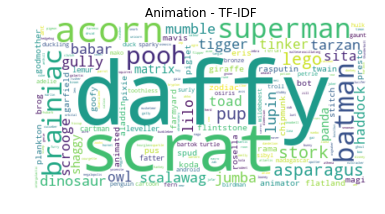

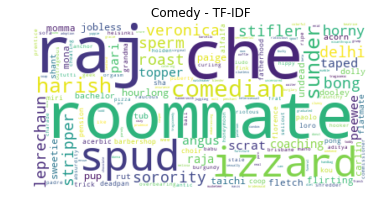

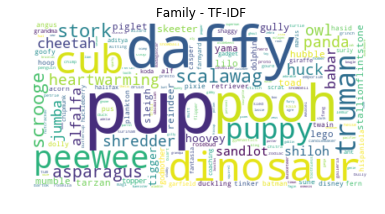

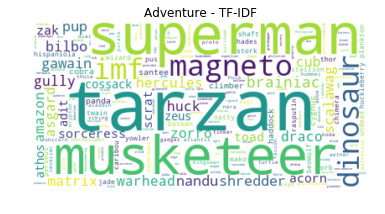

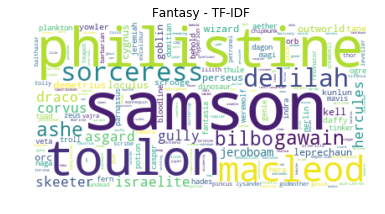

...

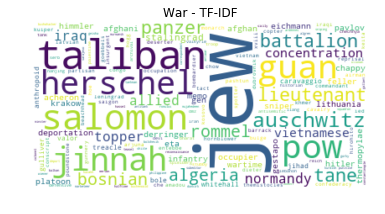

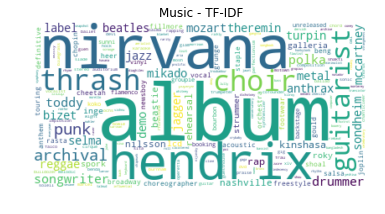

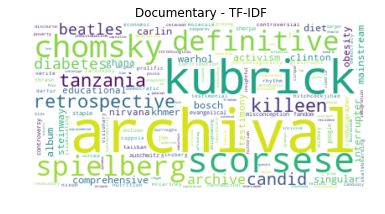

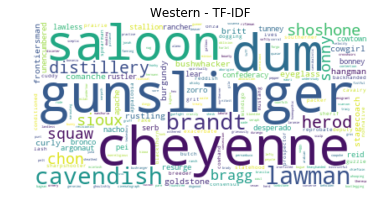

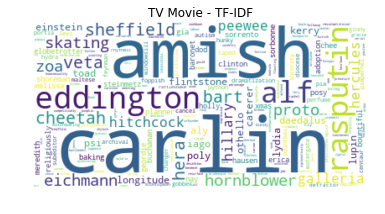

In [45]:
# Generate all the wordcloud for the TF-IDF of the genres
for genreName, genreTokens in tokensDict.items():
    genreTFIDF = calculateAllTFIDF(genreTokens, tokensDict)
    genreWordcloud = generateWordcloudFromFrequencies(genreTFIDF)
    
    plt.title(genreName + ' - TF-IDF')
    plt.imshow(genreWordcloud, interpolation="bilinear")
    plt.axis("off")
    #plt.savefig('./wordcloud_images/tfidf/genreTFIDF-'+genreName+'.png')
    plt.show()

Using this we can clearly see that some words define different genres. For example if we look at the the Romance genre, we can see that the word flirting is highlighted, meaning that it is a word pretty unique to the Romance genre.

To further look at the movie plots, we wanted to also look at wordclouds just based on the frequencies of the words, and not by taking into account the uniqueness based on TF-IDF. Using this we could create wordclouds based on the plots of the different genres.

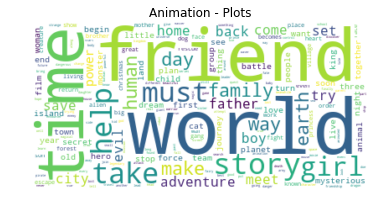

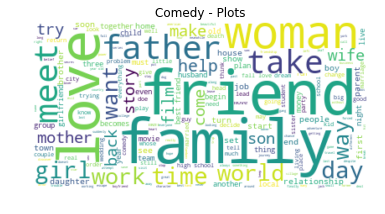

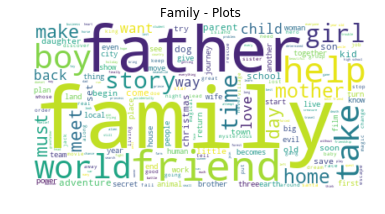

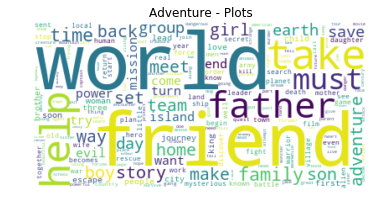

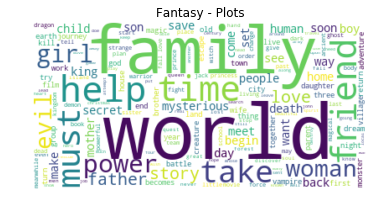

...

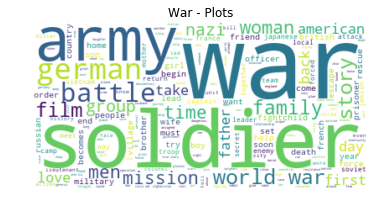

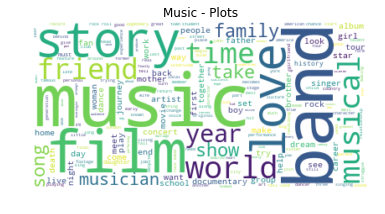

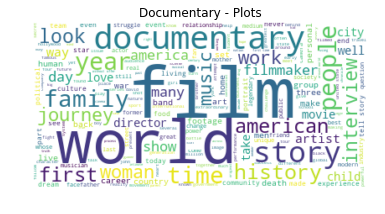

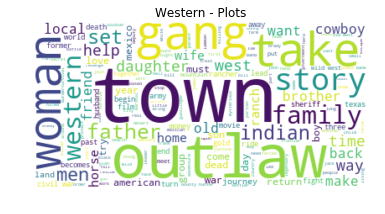

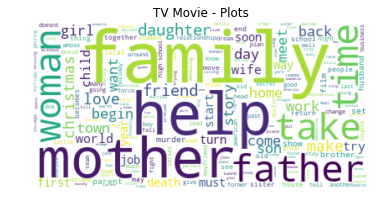

In [46]:
# Generate all the wordcloud for the plot words of the genres
for genreName, genreTokens in tokensDict.items():
    genreWordcloud = generateWordcloudFromString(" ".join(genreTokens))
    
    plt.title(genreName + ' - Plots')
    plt.imshow(genreWordcloud, interpolation="bilinear")
    plt.axis("off")
    #plt.savefig('./wordcloud_images/plot/genrePlots-'+genreName+'.png')
    plt.show()

Using this method, we could clearly see that some words go across all of the genres, such as friend, however we could still clearly see that the different genres use a majority of different words. For example the Mystery genre use words such as murder and death a lot.

### Decade

To look now at the different genres across the four different decades we have data from, we wanted to create wordcloud based on decades of the genres. Using this we can see if any genre changes its main words over the years.

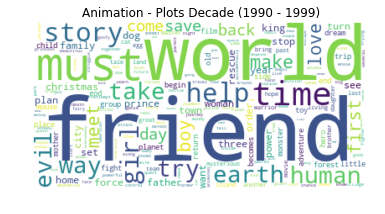

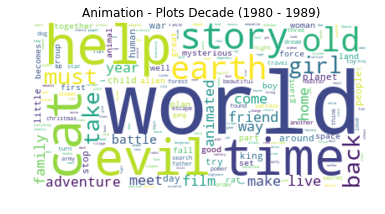

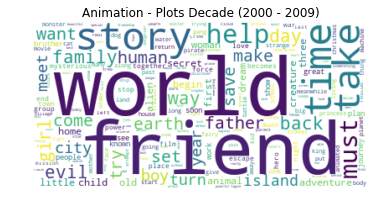

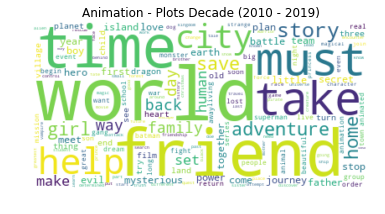

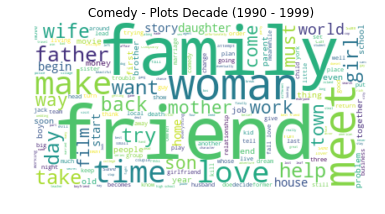

...

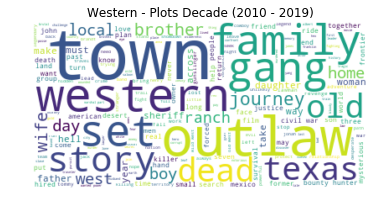

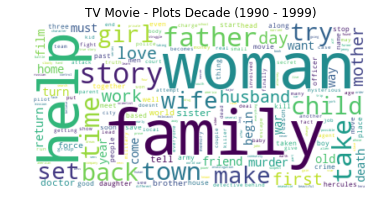

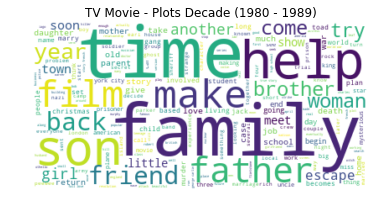

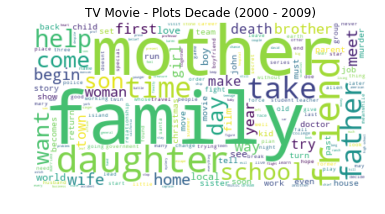

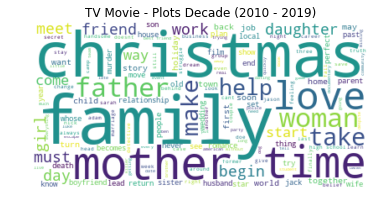

In [47]:
# Generate all the wordcloud for the plot words of a genre based on decade
for selectedGenre, _ in tokensDict.items():
    for decade, genresDictionary in moviePlotsByDecadeAndGenre.items():
        decadeGenreTokens = tokenize(genresDictionary[selectedGenre], excludeWords)
        genreDecadeWordcloud = generateWordcloudFromString(" ".join(decadeGenreTokens))

        plt.title(selectedGenre + ' - Plots Decade (' + str(decade) + ' - ' + str(decade + 9) + ')')
        plt.imshow(genreDecadeWordcloud, interpolation="bilinear")
        plt.axis("off")
        #plt.savefig('./wordcloud_images/decades/decadePlot-' + str(decade) + '-' + selectedGenre + '.png')
        plt.show()

Looking at the different wordclouds, we could clearly see that many genres keep the majority of words consitent across the decades. For example the Science Fiction genre, are consistent in using words such as alien, and earth. This came as a little of a surprise, as we thought there might have been a greater difference in the words used across the decades, as we have had great technological advancements over the years. With the technological advancements, we thought that the Science Fiction genre might have changed the main words of the genre to reflect this advancement.

### Actors

To take a closer look at the different actors, we wanted to first create a wordcloud for each genre based on the most dominant actors in each genre. Using these, we wanted to take a look at the wordclouds by some of the top actors of the different genres to see if we could see any correlation between the top actors of the genres and their generally used plot words.

In [48]:
genresActors = {}
for _, movie in moviesDictionary.items():
    for genre in movie.genres:
        if not genre in genresActors:
            genresActors[genre] = []

        for actor in movie.actors:
            genresActors[genre].append(actor.name)

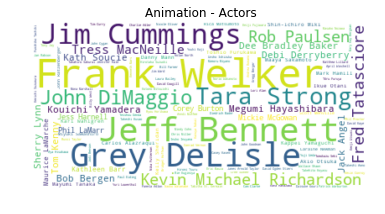

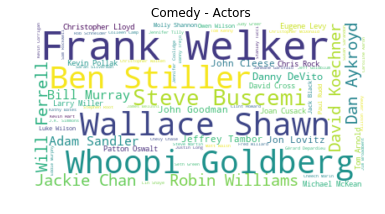

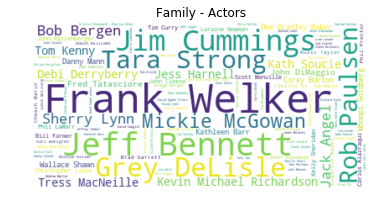

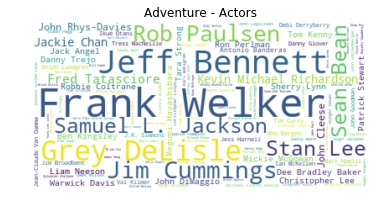

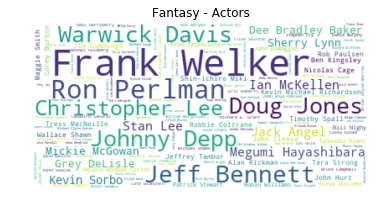

...

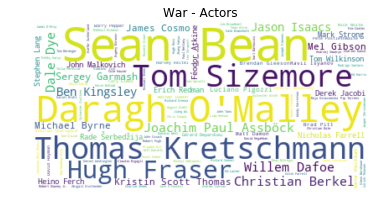

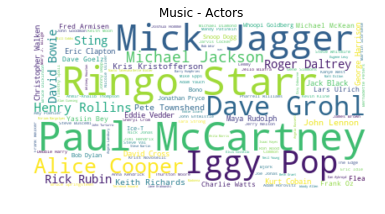

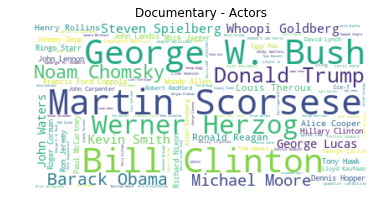

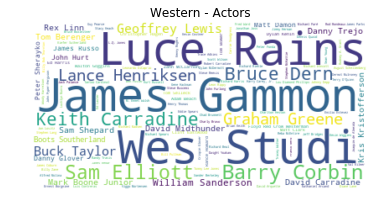

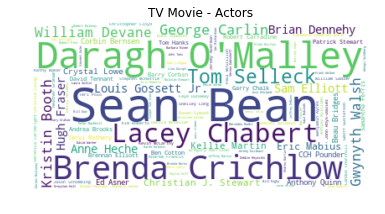

In [49]:
for genreName, actors in genresActors.items():
    actorsNameCount = defaultdict(int)
    for actor in actors:
        actorsNameCount[actor] += 1
        
    genreActorsWordcloud = generateWordcloudFromFrequencies(dict(actorsNameCount))
    plt.title(genreName + ' - Actors')
    plt.imshow(genreActorsWordcloud, interpolation="bilinear")
    plt.axis("off")
    #plt.savefig('./wordcloud_images/movie_actors/genre-'+genreName+'.png')
    plt.show()

To take a little closer look at how different actors movie plots differentiate, we wanted to look at some of our favorite actors across different genres. To do this we wanted to create wordcloud of the plots of specific actors

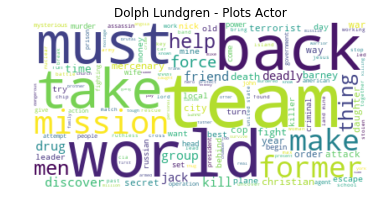

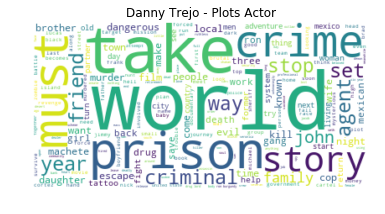

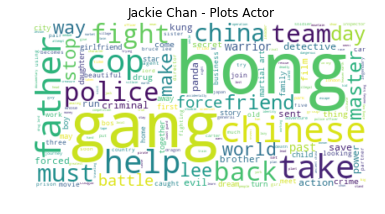

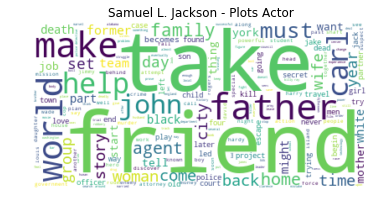

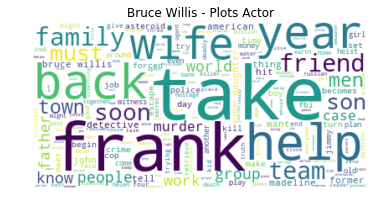

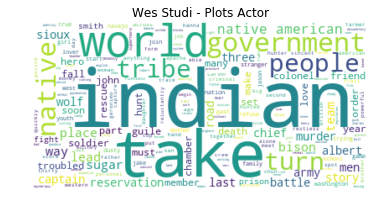

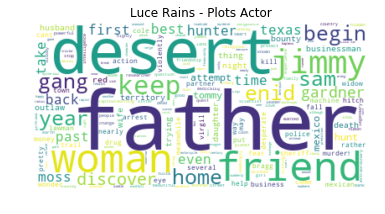

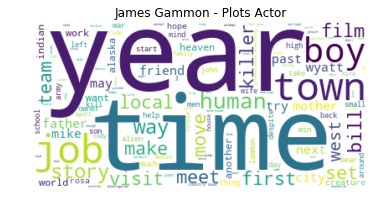

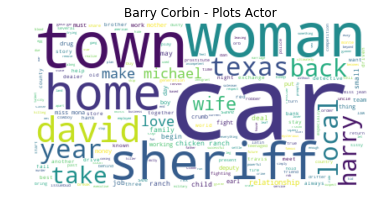

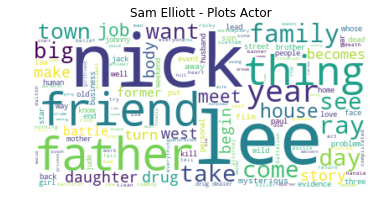

In [50]:
# Action-based
# - 16644 - Dolph Lundgren
# - 11160 - Danny Trejo
# - 18897 - Jackie Chan
# - 2231 - Samuel L. Jackson
# - 62 - Bruce Willis

# Western-based
# - 15853 - Wes Studi
# - 53969 - Luce Rains
# - 16433 - James Gammon
# - 12852 - Barry Corbin
# - 16431 - Sam Elliott
selectedActorsIds = [16644, 11160, 18897, 2231, 62, 15853, 53969, 16433, 12852, 16431]

for selectedActorId in selectedActorsIds:
    selectedActor = actorsDictionary[selectedActorId]
    
    actorTokenizedPlots = []
    for movie in selectedActor.movies:
        actorTokenizedPlots.extend(tokenize(movie.plot, excludeWords))

    actorWordcloud = generateWordcloudFromString(" ".join(actorTokenizedPlots))

    plt.title(selectedActor.name + ' - Plots Actor')
    plt.imshow(actorWordcloud, interpolation="bilinear")
    plt.axis("off")
    #plt.savefig('./wordcloud_images/actors/actor-' + str(selectedActor.name) + '.png')
    plt.show()

Using these wordclouds we could see that some actors differentiate in the use of words based on the genre that we initially thought they might dominate in. For example James Gammon use words such as town, killer and story where Jackie Chan mainly have words such as gang, cop and police.

## Sentiment Analysis

Now we have a general of the different words that occur in different contexts of movie plots. Let us now extend this analysis by analysing the plots of the movies we have, using sentiment analysis. This will allow us to identify just how positive a movie plot actually is. Ideally, we would analyse the scripts of the movies, but since we have chosen such a large dataset in order to see connections between a large amount of movies, we are going to use the plots instead. The plots of movies will still give us an idea of how positive a movie is.

In [51]:
plotWordsLen = []

for _, movie in moviesDictionary.items():
    plotWordsLen.append(len(movie.plot.split()))

print("Average number of words in a movie plot:", np.average(plotWordsLen))

Average number of words in a movie plot: 76.78939271663472


To assign a sentiment score to the words we use the *LabMT wordlist*. A higher sentiment value means a greater use of positive words.

When calculating the total score of a list of words, the number of words obviously matter. In our case, this would mean that a movie with a very long and detailed plot, would have a higher chance of getting a higher sentiment score than a shorter one, even though the words used actually aren't more positive. We will therefore normalize our sentiment score when calculating it, by dividing with the number of words. This means that the difference between a high and a low sentiment score will be very close for our plots, making a small difference in score significant. 

**First we will read the wordlist into a dictionary:**

In [52]:
# creating dictionary containing sentiment score of words
sentimentDictionary = {}

with open('./Data_Set_S1.txt') as csvFile:
    csvReader = csv.reader(csvFile, delimiter='\t')
    lineCount = 0
    for i, row in enumerate(csvReader):
        # skip first couple rows that don't contain data
        if (i < 4):
            continue
        
        keyWord = row[0]
        dataScore = float(row[2])
        sentimentDictionary[keyWord] = dataScore

**Then we will create the function to calculate the normalized sentiment score:**

In [53]:
# function to calculate the total sentiment score based on length of tokens
def calculate_sentiment_norm(token_list):
    sentiment_sum = 0
    for token in token_list:
        if token in sentimentDictionary.keys():
            sentiment_sum += sentimentDictionary[token]
            
    return (sentiment_sum / len(token_list))

The first interesting thing to look at, is whether there is a correlation between the rating and the sentiment score of the plot. I.e. are movies with positive plots generally rated higher?

In [54]:
# dictionary containing sentiment score of all movies 
moviesSentimentDict = {}

for _, movie in moviesDictionary.items():
    # tokenize plot
    tokens = tokenize(movie.plot, [])
    #calculate score
    score = calculate_sentiment_norm(tokens)
    
    moviesSentimentDict[movie.id] = {'movie': movie, 'score': score}

In [55]:
# sort list of movies by imdb rating
sortedMovieList = sorted(moviesSentimentDict.items(), key=lambda x: x[1]['movie'].imdbRating, reverse=True)

movieRatings = []
movieScores = []

for _, movieItem in sortedMovieList:
    movieRatings.append(movieItem['movie'].imdbRating)
    movieScores.append(movieItem['score'])

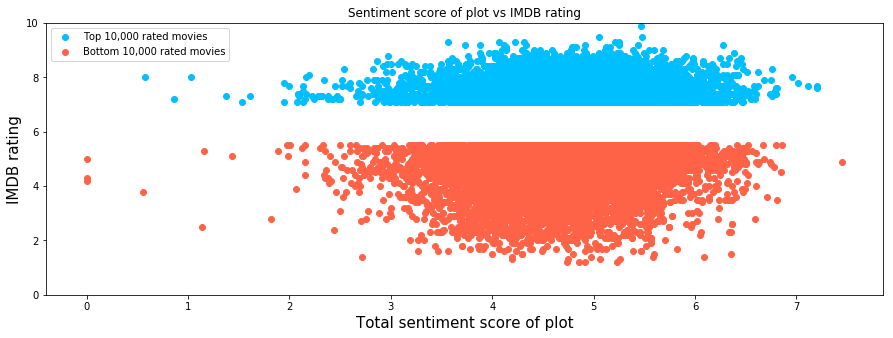

In [56]:
# get only the 10000 best rated movies and 10000 worst rated movies
plt.figure(figsize=(15,5))
plt.scatter(movieScores[:10000], movieRatings[:10000], c='deepskyblue', label='Top 10,000 rated movies')
plt.scatter(movieScores[-10000:], movieRatings[-10000:], c='tomato', label='Bottom 10,000 rated movies')
plt.title('Sentiment score of plot vs IMDB rating')
plt.ylabel('IMDB rating', fontsize=15)
plt.xlabel('Total sentiment score of plot', fontsize=15)
plt.ylim(0,10)
plt.legend()
plt.show()

A clear correlation between the rating and the sentiment of the plot, would mean that the lowest rated movies (red color) would be shifted to the left, and the top rated movies (blue) to the right. This is however not the case. But an interesting point is the fact that the bottom 10000 movies vary a lot more in rating than the top 10000. 

**Finding the genres with the most positive movie plots:**

We will now try to look at the plots of different genres, to see what genre contains the movies with the most positive plots.
We will do this by combining all plots from all movies in each different genre, and calculate the normalized sentiment score for the entire genre. We will also create a dictionary containing all movie plots of each decade, since the variation of score from year to year is too insignificant.

In [57]:
# calculate sentiment of movie plots
sentimentScoreGenre = {}
sentimentScoreDecade = {}

for genre, plots in moviePlotsByGenre.items():
    tokens = tokenize(plots, [])
    score = calculate_sentiment_norm(tokens)
    
    sentimentScoreGenre[genre] = score
    
for decade, plots in moviePlotsByDecade.items():
    tokens = tokenize(plots, [])
    score = calculate_sentiment_norm(tokens)
    
    sentimentScoreDecade[decade] = score

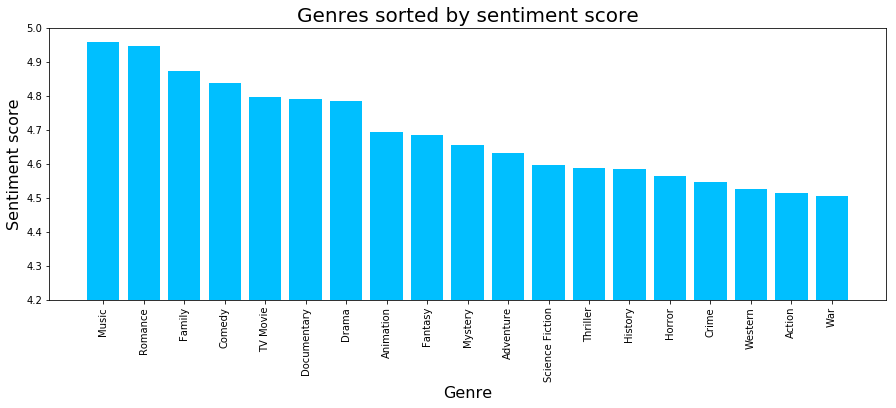

In [58]:
# sort genres by sentiment score
sortedList = sorted(sentimentScoreGenre.items(), key=lambda x: x[1], reverse=True)
genreTuple, scoreTuple = zip(*sortedList)

plt.figure(figsize=(15,5))
plt.bar(genreTuple, scoreTuple, align='center', color='deepskyblue')
plt.title("Genres sorted by sentiment score", fontsize=20)
plt.ylabel("Sentiment score", fontsize=16)
plt.xlabel("Genre", fontsize=16)
plt.xticks(rotation='vertical')
plt.ylim((4.2, 5))
plt.show()

As explained, the difference in sentiment scores are generally very small. Therefore, we have only shown the y-axis in the interval of 4.2-5.0 to better show the difference in sentiment scores. So the genre "Music" doesn't score twice as high as the genre "War".

The output is very much as expected. The genre that contains the movies with the highest sentiment score is "Music". This genre is for music movies like "Rocketman", "Yesterday" and "Bohemian Rhapsody". These movies are generally full of energy and therefore many positive words, which is why it makes sense that it scores the highest. The same goes for genres like "Romance" and "Family" which scores almost as high. The genre with the least positive movie plots is "War".  

**It's a bit funny that "History" scores almost as low as "Horror". There's definitely some food for thought there...**

### Sentiment based on decades

Investigating whether or not movies have actually gotten more positive over the past 40 years could be very interesting. So let's do that!

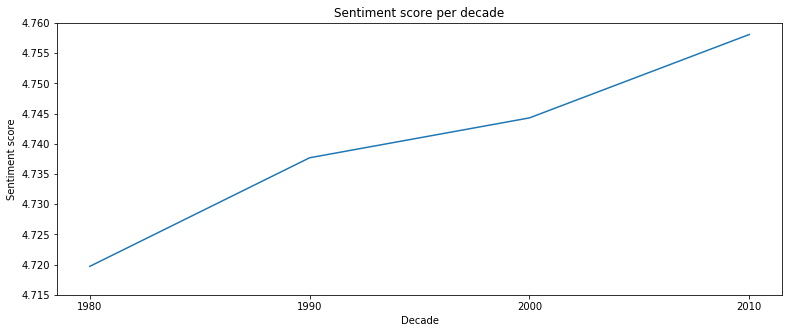

In [59]:
# sort decades based on scores
sortedList = sorted(sentimentScoreDecade.items(), key=lambda x: x[0])
decadeTuple, scoreDecadeTuple = zip(*sortedList)

# plot total sentiment score from each decade
plt.figure(figsize=(13,5))
plt.plot(decadeTuple, scoreDecadeTuple, '-')
plt.title("Sentiment score per decade")
plt.ylabel('Sentiment score')
plt.xlabel('Decade')
plt.xticks(list(decadeTuple))
plt.ylim((4.715, 4.76))
plt.show()

The lowest scoring decade is the 1980s and the highest scoring is the 2010s.
From the plot it can be seen that the sentiment actually increases every decade, which is cool. But note the interval of the y-axis. We did this to better show that the score increases. But before we go on and conclude that the 1980s were super negative and that only positive movies has been made in the 2010s, we have to look at the actual difference in the scores.

In [60]:
# score of worst scoring decade
minScore = min(scoreDecadeTuple)

# score of best scoring decade
maxScore = max(scoreDecadeTuple)
print("Percentage difference: {} %".format(((maxScore-minScore)/minScore)*100))

Percentage difference: 0.8132566896688845 %


The difference in score between the highest and lowest scoring decade is only 0,81%. And this is over the course of around 40 years. So it is not sufficient to conclude for certain that movies have actually gotten more positive. But it is still very interesting to see that the score actually increases with each decade

So now we have learned a few cool things. Let's dive into the actors and try to learn something about the sentiment of these. 
We'll start by finding the actors that star in the most positive movies.

### Actors starring in movies with most positive plots

Let's create a dictionary containing the sentiment score of all movies that an actor has starred in.

Since we want to investigate the pattern of movies that an actor stars in, we want to avoid actors that have only starred in a few movies. We will therefore only look at actors that has starred in 5 or more movies.

In [61]:
# sentiment score dict for all actors
actorsSentimentDict = {}
                       
for id, actor in actorsDictionary.items():
    # exclude actors featured in less than 5 movies
    if len(actor.movies) < 5:
        continue
        
    totalSentimentScore = 0  
    
    # loop all actor's movies and sum the sentiment score of them
    for movie in actor.movies:
        totalSentimentScore += moviesSentimentDict[movie.id]['score']
    
    # normalize the sentiment score
    normSentimentScore = totalSentimentScore / len(actor.movies)
    
    actorsSentimentDict[id] = {'actor': actor, 'score': normSentimentScore }

### Top 10 actors with highest sentiment scores of movies

We can now display the top 10 actors who have collectedly starred in the most positive movies:

In [62]:
sortedActorsList = sorted(actorsSentimentDict.items(), key=lambda x: x[1]['score'], reverse=True)

print("Top 10 actors with highest sentiment scores of movies:\n")
print('{0:5} {1:20} {2:40}'.format('Rank', 'Actor','Sentiment score'))

print('-----------------------------------------')

for i, (_, actorItem) in enumerate(sortedActorsList[:10]):
    print('{0:2} {1:20} {2:20}'.format(i + 1, actorItem['actor'].name, actorItem['score']))

Top 10 actors with highest sentiment scores of movies:

Rank  Actor                Sentiment score                         
-----------------------------------------
 1 Diana Kaarina           6.015151155779916
 2 Maryke Hendrikse        5.995487594762923
 3 Ramesh Pisharody        5.884511050353155
 4 Matt Cameron            5.781167607392607
 5 Alexandr Domogarov Jr.   5.7777462439521265
 6 Stone Gossard           5.774920374581559
 7 Johanna Penski          5.772247909015209
 8 Julieta Cardinali       5.768713731060607
 9 Chiara Francini         5.763108386187456
10 Aleksey Filimonov       5.759582028985507


The actor with the highest total sentiment score is Diani Kaarina. From her IMDB-page we can see that she mainly does voice-over for animations and children movies. As we saw with the word clouds previously, the Animation genre contains a lot of words that generally are considered very positive, like "friend".

### Bottom 10 actors with highest sentiment scores of movies

Correspondingly we can display the bottom 10 actors who collectedly starred in the most negative movies according to our analysis.

In [63]:
sortedActorsList = sorted(actorsSentimentDict.items(), key=lambda x: x[1]['score'], reverse=True)

print("Bottom 10 actors with lowest sentiment scores of movies:\n")
print('{0:5} {1:20} {2:40}'.format('Rank', 'Actor','Sentiment score'))

print('-----------------------------------------')

for i, (_, actorItem) in enumerate(sortedActorsList[-10:]):
    print('{0:2} {1:20} {2:15}'.format(len(sortedActorsList) - i, actorItem['actor'].name, actorItem['score']))

Bottom 10 actors with lowest sentiment scores of movies:

Rank  Actor                Sentiment score                         
-----------------------------------------
23362 Gloria Hendry        3.639881814365686
23361 Ingrid Rubio         3.6352244568848344
23360 Janet Julian         3.598201930601148
23359 Mary Carrillo        3.5877749999999997
23358 Mario Pedone          3.583149174497
23357 Efrem Zimbalist Jr.  3.560291608783544
23356 Zhou Yun             3.5026897990804047
23355 Mario Donatone       3.498680494818016
23354 Nozha Khouadra       3.443742498079306
23353 Søren Spanning       3.4004987638139132


It is quite funny that the actor with the lowest total sentiment is Danish. From Søren Spanning's IMDB-page it is seen that he mainly star in Drama movies. As we saw with the word clouds previously, this genre contains a lot of words that generally aren't considered too positive.

### Sentiment Analysis Based on Gender

Let's look further into the actors of the movies, to determine if there is a correlation between positivy of movies and gender. I.e. do men or women generally star in more positive movies?

We'll make two lists containing all scores of men and women respectively. Some of the actors in our dataset doesn't have gender defined. We will leave these out:

In [64]:
maleSentiment = []
femaleSentiment = []

for actorName, item in actorsSentimentDict.items():
    if item['actor'].gender == 1:
        maleSentiment.append(item['score'])
    elif item['actor'].gender == 2:
        femaleSentiment.append(item['score'])
        
print("Number of male actors:", len(maleSentiment))
print("Number of female actors:", len(femaleSentiment))

Number of male actors: 7110
Number of female actors: 13417


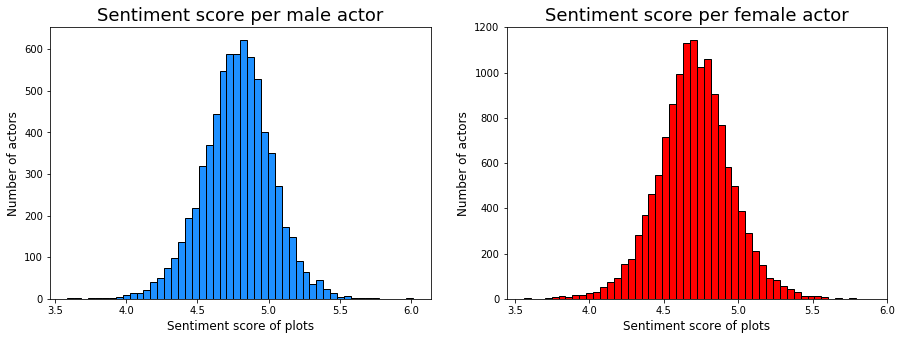

In [65]:
# plotting scores of men and women

plt.figure(figsize=[15,5])
plt.subplot(1,2,1)
plt.hist(maleSentiment, color="dodgerblue", bins=50, edgecolor="black")
plt.xlabel("Sentiment score of plots", size=12)
plt.ylabel("Number of actors", size=12)
plt.title("Sentiment score per male actor", size=18)

plt.subplot(1,2,2)
plt.hist(femaleSentiment, color="red", bins=50, edgecolor="black")
plt.xlabel("Sentiment score of plots", size=12)
plt.ylabel("Number of actors", size=12)
plt.title("Sentiment score per female actor", size=18)
plt.show()

As can be seen the two graphs are very similar. The main difference is the number of actors in each category. Our data is normally distributed so both the mean and median of the data are fine to use if we want to compare them. We will use the mean to compare men and women:

In [66]:
maleMean = np.mean(maleSentiment)
femaleMean = np.mean(femaleSentiment)

print("Male sentiment mean:", maleMean)
print("Female sentiment mean:", femaleMean)

Male sentiment mean: 4.7798512261700585
Female sentiment mean: 4.703401256541042


In [67]:
print("Percentage difference: {} %".format(((maleMean-femaleMean)/femaleMean)*100))

Percentage difference: 1.6254188290377538 %


This means that men generally star in more positive movies than women. This might be a bit surprising, since you could argue that women usually are more sentiment than men. 

## Discussion

Throughout the assignment different kind of analysis were performed in order to gain a greater insight into the world of movies and the underlying data. During these analysis the overall flow of retrieving data, predicting outcomes and analysing the movies went smooth. 

However after our analysis we found that our retrieved data could have included some more interesting information to further achieve a greater understanding and analysis of the movies networks. This could include data such as movie scripts to have a better foundation of creating a sentiment analysis, based on characters played by different actors instead of just plots of the movie, which did not say much about how positive og negative each actor might be. Another thing that could have been improved thought the assignment, would have been to maybe focued on a specific genre of movies or movies within a specific timespan to create a more detailed analysis, instead of our overall analysis of all movies and all genres in the timespan from 1980 to 2019. During a more detailed analysis of some specific elements would have given us a much clear image of how movies in a specific genre varied from each other, maybe based on if they had any accompaning genres compared to only being classified as one specific genre.

## Contributions

In the overall project all three members of the group help each other to complete and analyse all of the data. However throughout the assignment Frederik Oliver Flint had the main responsibility for the network analysis, such as creation of network graph and community detection, Emil Godsk had the main responsibility of handling wordclouds, TF-IDF analysis and data preprocessing for filtering out data and struturing it, and Oscar Gervin Fehrn had the main responsibility of handling sentiment analysis as well as string tokenizing.